### Task: Write a program in Python to detect the change from the images (Pre.jpg and Post.jpg) of the same map location.

### Solution!👇

# Method 1

### Finding Image Difference using OpenCV and Python.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/images/Pre.jpg
/kaggle/input/images/Post.jpg


In [2]:
pip install imutils

  Created wheel for imutils: filename=imutils-0.5.3-py3-none-any.whl size=25850 sha256=92eb2ead5d272dcd70a588b604f303c4afa0e62ceb5bb0595cb170694b9a09ae
  Stored in directory: /root/.cache/pip/wheels/fc/9c/6d/1826267c72afa51b564c9c6e0f66abc806879338bc593a2270
Successfully built imutils
Note: you may need to restart the kernel to use updated packages.


In [3]:
# importing the necessary packages
from skimage.metrics import structural_similarity
import imutils
import cv2


In [4]:
# load the two input images
imageA = cv2.imread('/kaggle/input/images/Pre.jpg')
imageB = cv2.imread('/kaggle/input/images/Post.jpg')
# convert the images to grayscale
grayA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)

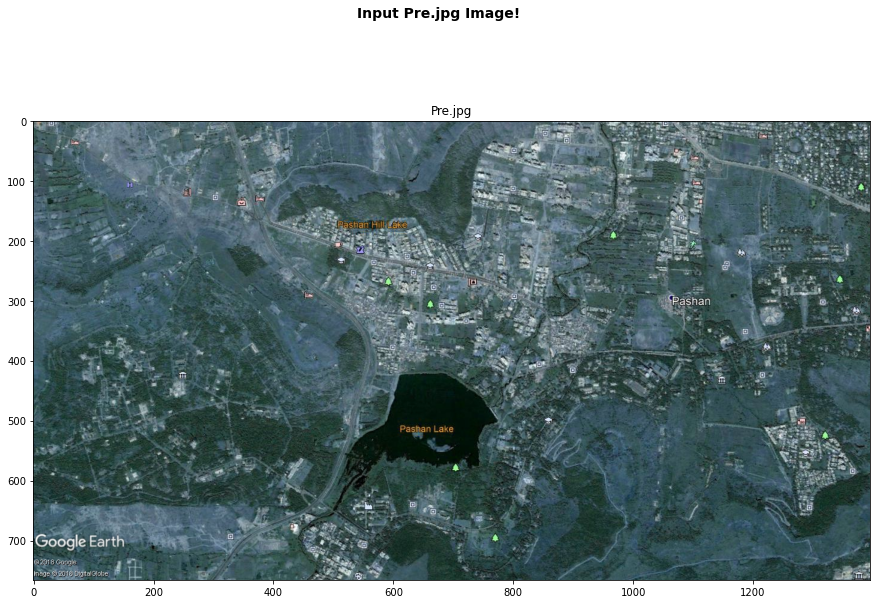

In [5]:
# Plotting the Input Images.
plt.figure(figsize=(15,10))
plt.suptitle('Input Pre.jpg Image!', fontsize=14, fontweight='bold')
plt.title("Pre.jpg")
plt.imshow(imageA)

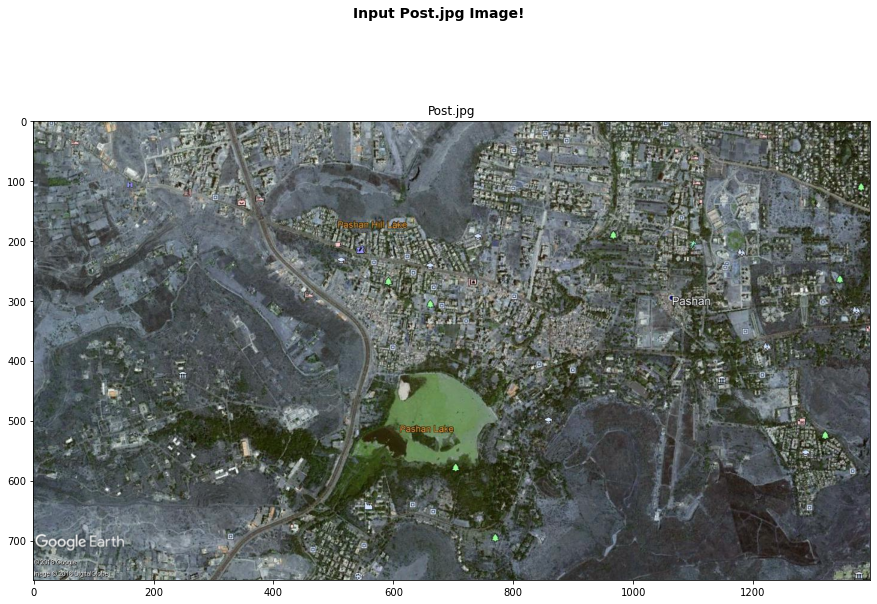

In [6]:
# Plotting the Input Images.
plt.figure(figsize=(15,10))
plt.suptitle('Input Post.jpg Image!', fontsize=14, fontweight='bold')
plt.title("Post.jpg")
plt.imshow(imageB)

Similarity: 0.3779238610196616


'\n# Use this code to display the output into a separate window if you\'re using local machine.\ncv2.imshow("Original", imageA)\ncv2.imshow("Modified", imageB)\ncv2.imshow("Diff", diff)\ncv2.imshow("Thresh", thresh)\ncv2.waitKey(0)\n'

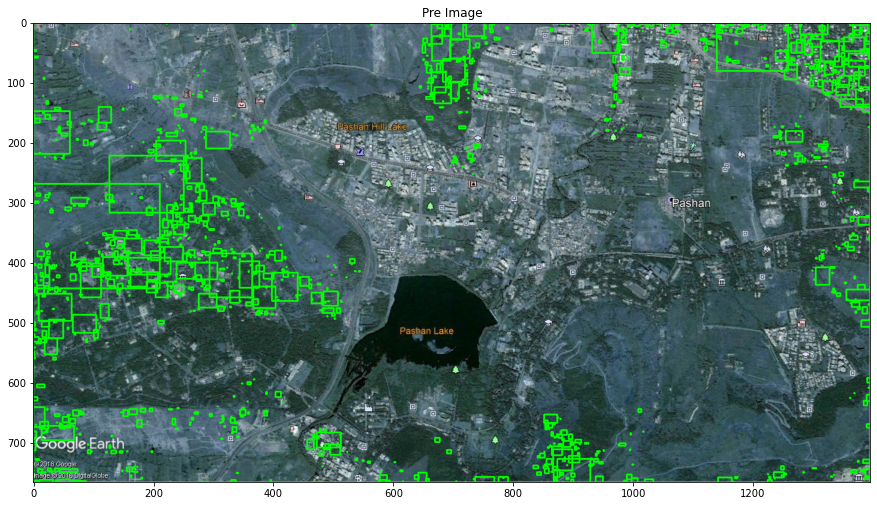

In [7]:
# compute the Structural Similarity Index (SSIM) between the two
# images, ensuring that the difference image is returned
(score, diff) = structural_similarity(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("Similarity: {}".format(score))

# Threshold the diff image, and find contours which will showcase the regions in the images
# that are different
thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

# loop over the contours and create bounding boxes on our two images
for c in cnts:
    # compute the bounding box of the contour and then draw the
    # bounding box on both input images to represent where the two images differ
    (x, y, w, h) = cv2.boundingRect(c)
    cv2.rectangle(imageA, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.rectangle(imageB, (x, y), (x + w, y + h), (255, 0, 0 ), 2)
    
# showing the output images

# Use below code to display the output into the notebook only.
plt.figure(figsize=(15,10))
plt.title("Pre Image")
plt.imshow(imageA)

'''
# Use this code to display the output into a separate window if you're using local machine.
cv2.imshow("Original", imageA)
cv2.imshow("Modified", imageB)
cv2.imshow("Diff", diff)
cv2.imshow("Thresh", thresh)
cv2.waitKey(0)
'''

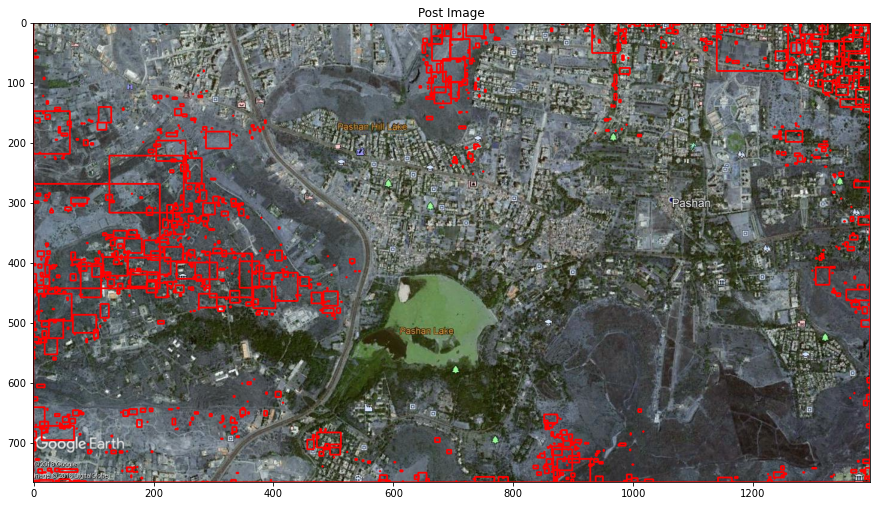

In [8]:
plt.figure(figsize=(15,10))
plt.title("Post Image")
plt.imshow(imageB)

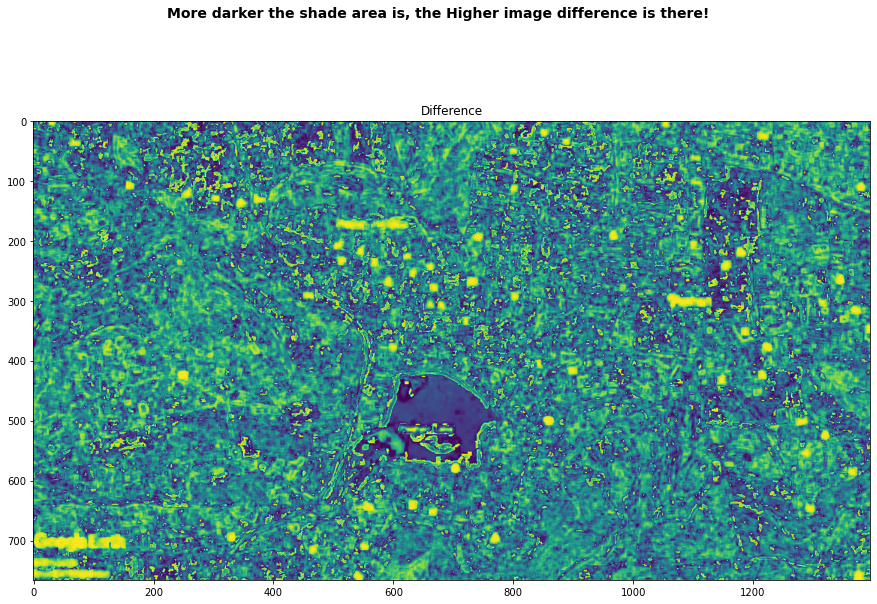

In [9]:
plt.figure(figsize=(15,10))
plt.suptitle('More darker the shade area is, the Higher image difference is there!', fontsize=14, fontweight='bold')
plt.title("Difference")
plt.imshow(diff)

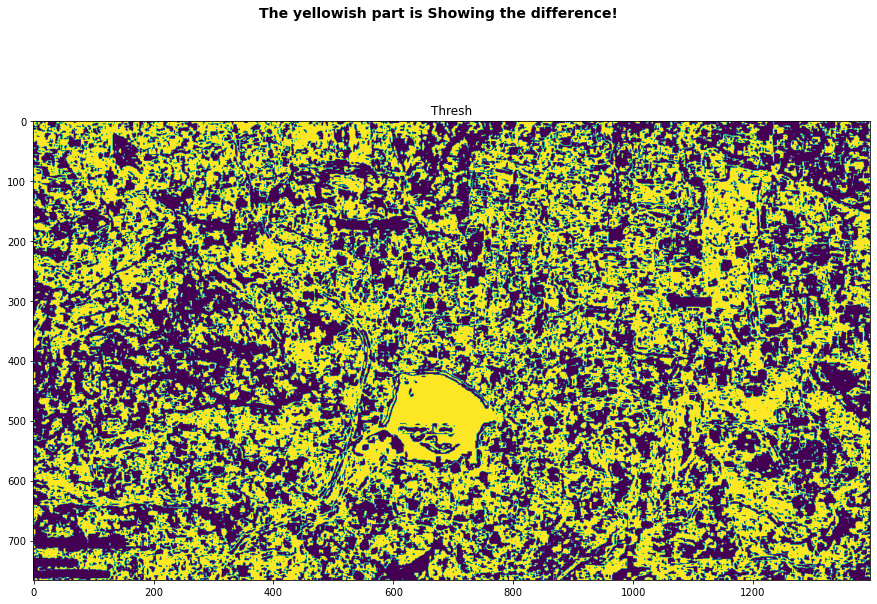

In [10]:

plt.figure(figsize=(15,10))
plt.suptitle('The yellowish part is Showing the difference!', fontsize=14, fontweight='bold')
plt.title("Thresh")
plt.imshow(thresh)

# Method 2

#### Finding Image Difference using ImageChops module of Python Imaging Library (PIL)

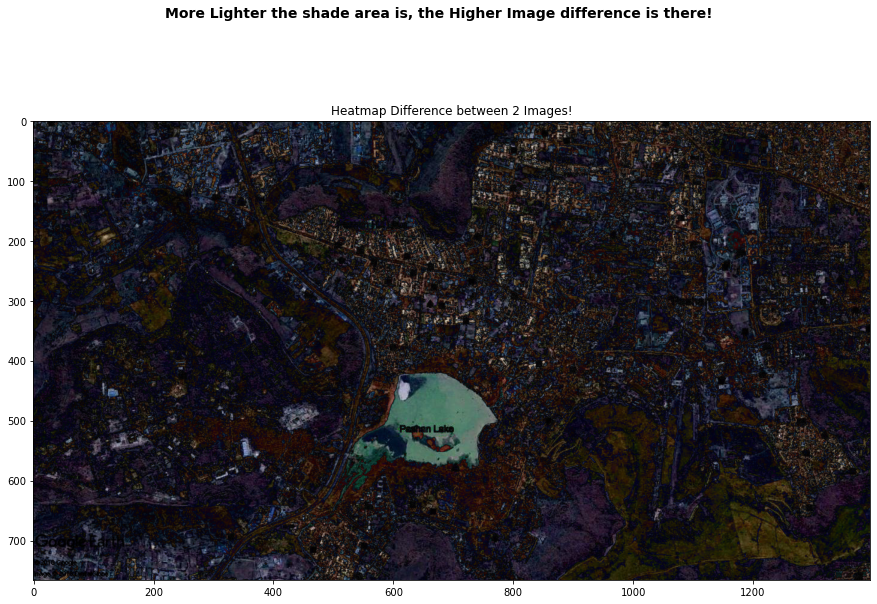

In [11]:
from PIL import Image, ImageChops

image1 = Image.open('/kaggle/input/images/Pre.jpg')
image2 = Image.open('/kaggle/input/images/Post.jpg')

# It Returns the absolute value of the pixel-by-pixel difference between the two Images.
diff = ImageChops.difference(image1, image2)

# Displaying the Result.
if diff.getbbox():
    image = diff
    
image.save("Difference.jpg")  # Saving the output file as Image.
plt.figure(figsize=(15,10))
plt.suptitle('More Lighter the shade area is, the Higher Image difference is there!', fontsize=14, fontweight='bold')
plt.title("Heatmap Difference between 2 Images!")
plt.imshow(image)

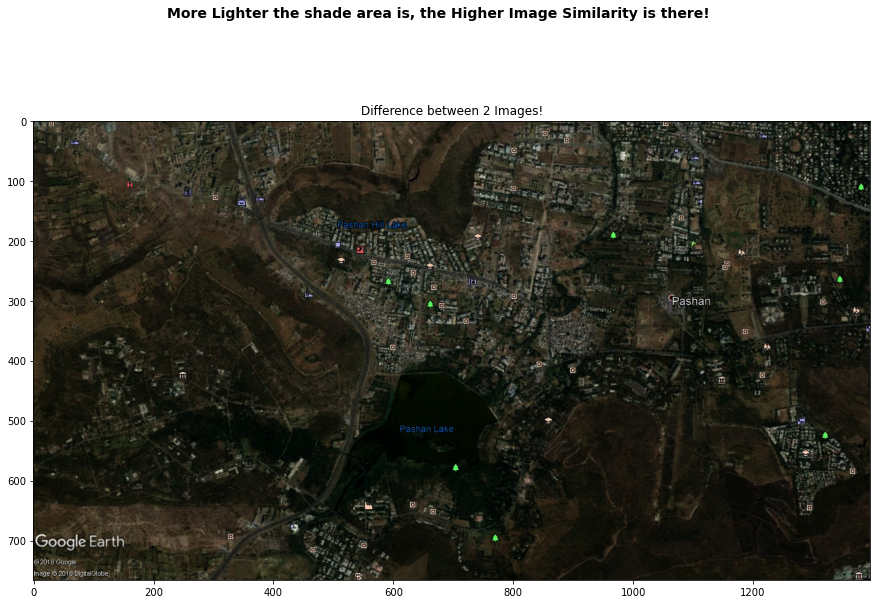

In [12]:
# It Returns the absolute value of the pixel-by-pixel Multiplication between the two Images.
diff = ImageChops.multiply(image1, image2)

# Displaying the Result.
if diff.getbbox():
    image = diff
    
image.save("Multiply_Difference.jpg")  # Saving the output file as Image.
plt.figure(figsize=(15,10))
plt.suptitle('More Lighter the shade area is, the Higher Image Similarity is there!', fontsize=14, fontweight='bold')
plt.title("Difference between 2 Images!")
plt.imshow(image)

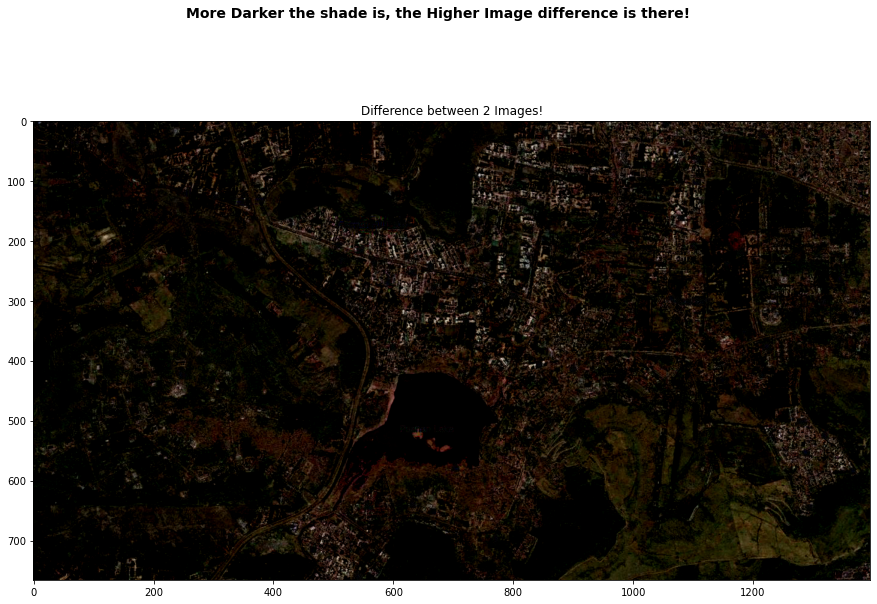

In [13]:
# It Returns the absolute value of the pixel-by-pixel Subtraction between the two Images.
diff = ImageChops.subtract(image1, image2, scale=1.0, offset=0)

# Displaying the Result.
if diff.getbbox():
    image = diff
    
image.save("Subtraction_Difference.jpg")  # Saving the output file as Image.
plt.figure(figsize=(15,10))
plt.suptitle('More Darker the shade is, the Higher Image difference is there!', fontsize=14, fontweight='bold')
plt.title("Difference between 2 Images!")
plt.imshow(image)

# Conclusion!

One can examine maps at different scales and make observations about the amount of detail one can see. We can compare satellite images with maps and use satellite images to measure and map changing land use. With the use of Computer Vision this task can be done in less time with a great accuracy. 

#### Thank You!